In [1]:
%load_ext autoreload
%autoreload 2
from models.PpgModel.PpgModel import PpgModel
from models.PpgModel.params import Parameters
import numpy as np
from pathlib import Path
from consts import Paths, save_current_conf
import datetime
from utils.log import logger
import dill
import nest


2024-06-03 22:02:47,476 [INFO ]  

>>>>> start execution

              -- N E S T --
  Copyright (C) 2004 The NEST Initiative

 Version: 3.7.0
 Built: Apr 15 2024 07:13:33

 This program is provided AS IS and comes with
 NO WARRANTY. See the file LICENSE for details.

 Problems or suggestions?
   Visit https://www.nest-simulator.org

 Type 'nest.help()' to find out more about NEST.



In [2]:
p = Parameters()
sound = 1000  # Hz
# angles = [-90]
angles =  np.arange(-90,100,15)
time_sim = 1000

In [3]:
result = {}
angle_to_rate = {}
for angle in angles:
    nest.ResetKernel()
    logger.info(f"\t\tcurrent angle: {angle}")
    model = PpgModel(p, sound, angle, time_sim)
    logger.info(f"\t\t\tmodel initialized. begin simulation...")
    model.simulate(time_sim)
    logger.info(f"\t\t\t...simulation complete. collecting results...")
    angle_to_rate[angle] = model.analyze()

result_file = Path(Paths.RESULTS_DIR).joinpath(
    f"{sound}Hz_tone-ppg-{datetime.datetime.now().isoformat()[:-5]}.pic"
)
result["conf"] = save_current_conf(model, p, str(sound) + "Hz_tone")
result["angle_to_rate"] = angle_to_rate

logger.info(f"\tsaving results for ppg to {result_file.absolute()}...")
with open(result_file, "wb") as f:
    dill.dump(result, f)


2024-06-03 22:02:49,496 [INFO ]  		current angle: -90
2024-06-03 22:02:49,497 [INFO ]  creating pulsepacket generator according to input IHC response...


2024-06-03 22:02:57,137 [INFO ]  creating rest of network...
2024-06-03 22:02:57,138 [INFO ]  model creation complete.
2024-06-03 22:02:57,139 [INFO ]  			model initialized. begin simulation...

Jun 03 22:02:57 NodeManager::prepare_nodes [Info]: 
    Preparing 101504 nodes for simulation.

Jun 03 22:02:57 SimulationManager::run [Warning]: 
    The requested simulation time is not an integer multiple of the minimal 
    delay in the network. This may result in inconsistent results under the 
    following conditions: (i) A network contains more than one source of 
    randomness, e.g., two different poisson_generators, and (ii) Simulate is 
    called repeatedly with simulation times that are not multiples of the 
    minimal delay.

Jun 03 22:02:57 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 101504
    Simulation time (ms): 1
    Number of OpenMP threads: 1
    Not using MPI

Jun 03 22:02:57 SimulationManager::run [Info]: 
    Simulation finished.

Jun 03 22:

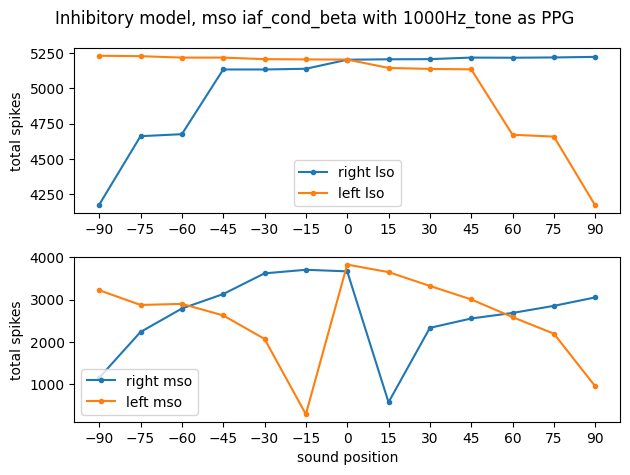

In [8]:
import matplotlib.pyplot as plt

def draw_rate_vs_angle(data):
    angle_to_rate = data["angle_to_rate"]
    name = data["conf"]["model_desc"]["name"]
    sound_key = str(sound) + "Hz_tone"
    # sound_key = data["conf"]["sound_key"]
    
    angles = list(angle_to_rate.keys())

    arr_n_spikes_r_lso = [x["n_spikes_r_lso"] for angle, x in angle_to_rate.items()]
    arr_n_spikes_l_lso = [x["n_spikes_l_lso"] for angle, x in angle_to_rate.items()]
    arr_n_spikes_r_mso = [x["n_spikes_r_mso"] for angle, x in angle_to_rate.items()]
    arr_n_spikes_l_mso = [x["n_spikes_l_mso"] for angle, x in angle_to_rate.items()]
    
    fig, [lso, mso] = plt.subplots(2, 1)
    fig.suptitle(f"{name} with {sound_key} as PPG")
    plt.setp([lso,mso], xticks = angles)

    lso.plot(angles, arr_n_spikes_r_lso, ".-", label="right lso")
    lso.plot(angles, arr_n_spikes_l_lso, ".-", label="left lso")
    lso.set_ylabel("total spikes")
    _ = lso.legend()

    mso.plot(angles, arr_n_spikes_r_mso, ".-",  label="right mso")
    mso.plot(angles, arr_n_spikes_l_mso, ".-",  label="left mso")

    mso.set_xlabel("sound position")
    mso.set_ylabel("total spikes")
    _ = mso.legend()
    plt.tight_layout()

draw_rate_vs_angle(result)